# 0. Import module and data

In [1]:
# plt에 한글 폰트 적용
# mpl.rc("font", family = "AppleGothic")

# pickle
import pickle

# 날짜 타입 데이터
import datetime

# module
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import pandas as pd
import sklearn as sk

# Linear Regression Model - sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Linear Regression Model - statsmodels 
import statsmodels.api as sm

# dmatrix
from patsy import *

# 1. 데이터 전처리

## 1.1 기상 데이터 전처리

In [162]:
df_weather = pd.read_csv("data/raw/daily/weather_daily.csv", encoding='euc-kr')

In [163]:
df_weather["일시"] = df_weather["일시"].astype("datetime64")

In [164]:
df_weather.tail(2)

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10)
1619,2019-06-08,21.9,NaN,1.4,50.0,57.5,997.9,9.3,5.9
1620,2019-06-09,21.6,2.5,1.8,290.0,66.1,995.5,4.2,8.9


### 1.1.1 Null data

In [165]:
df_weather.isnull().sum()

일시                 0
평균기온(°C)           0
일강수량(mm)        1032
평균 풍속(m/s)         3
최다풍향(16방위)         3
평균 상대습도(%)         0
평균 현지기압(hPa)       0
합계 일조 시간(hr)       9
평균 전운량(1/10)       0
dtype: int64

### 강수량 처리: 기후통계지침(2019) p.65
- 1.3.5.4 강수량이 없을 경우에는 공란으로 둔다.
- 1.3.5.5 강수량이 0.1mm 미만이거나 관측할 수 없을 정도의 양은 0000으로 기입한다.
    - 예) 0.1mm → 0001, 13.0mm → 0130, 5.7mm → 0057, 45.6mm → 0456, 123.0mm → 1230, 630.7mm → 6307

In [166]:
# 강수량은 0으로 맞춰준다.
df_weather["일강수량(mm)"].fillna(value= 0, inplace=True)

### 풍속, 풍향 처리: 기후통계지침(2019) p. 64
- 1.3.1 풍향 36위(**) 2자리
    - 1.3.1.1 16방위로 관측된 매시풍향을 [표A-3]에 따라 2자리로 기입한다. 정온(풍속 0.4m/s 이하)일 경우에는 00으로 하고 공란이나 "-"로 하지 않는다. 단, 결측일 때는 풍향, 풍속은 공란 으로 하고 비고란에 결측 사유를 기록한다.(상기 사항은 합계란을 포함, 모든 요소에 공통이다.)

In [167]:
df_weather[df_weather["평균 풍속(m/s)"].isnull()]

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10)
1017,2017-10-14,14.4,0.0,NaN,NaN,42.8,1015.5,10.6,4.9
1069,2017-12-05,-4.2,0.1,NaN,NaN,40.1,1012.0,2.1,1.6
1070,2017-12-06,0.2,1.2,NaN,NaN,72.6,1011.7,7.7,7.0


In [168]:
# 풍속, 풍향이 없는 값은 결측치이므로 Drop
df_weather = df_weather[~df_weather["평균 풍속(m/s)"].isnull()]

### 일조 시간 처리: 기후통계지침(2019) p. 63
- 1.3.8 일조 0.1hr(**) 2자리
    - 1.3.8.1 일출부터 일몰까지의 일조가 나타난 시간을 2자리로 기입한다.
    - 1.3.8.2 분(分)은 시간으로 환산 기입한다.
        - 예) 일조시간 35분 → 06, 60분 → 10
    - 1.3.8.3 일조 및 일사의 기입은 일출부터 일몰까지의 가조시수 내에 현상이 없을 때는 각각 00, 000으로 기입하고 기타란은 공란으로 둔다.

In [169]:
df_weather[df_weather["합계 일조 시간(hr)"].isnull()]

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10)
1001,2017-09-28,19.2,0.0,2.8,270.0,49.1,1000.5,NaN,2.5
1015,2017-10-12,11.4,0.0,2.0,270.0,71.0,1010.4,NaN,7.1
1054,2017-11-20,-0.4,0.0,1.4,270.0,55.3,1016.0,NaN,3.5
1061,2017-11-27,2.5,0.0,1.3,50.0,53.0,1016.1,NaN,0.9
1064,2017-11-30,-2.4,0.0,3.3,290.0,26.8,1018.0,NaN,2.0
1113,2018-01-18,2.1,0.0,1.9,290.0,59.6,1012.9,NaN,8.6
1121,2018-01-26,-14.8,0.0,2.6,320.0,34.9,1018.9,NaN,0.0
1141,2018-02-15,-0.7,0.0,2.5,290.0,28.0,1011.5,NaN,3.8
1283,2018-07-07,23.7,0.0,1.6,90.0,51.4,1000.3,NaN,3.6


In [170]:
# 일조 시간이 없는 값은 결측치이므로 Drop
df_weather = df_weather[~df_weather["합계 일조 시간(hr)"].isnull()]

### 1.1.2 독립변수와 관련이 있으면서 회귀분석에 도움이 될만한 추가 데이터 제작(폐기)

### 불쾌지수 계산

<img src="https://www.kma.go.kr/images/HELP/basic_new/modify_03.gif">

|단계|지수범위|설명 및 주의사항|
|---|---|---|
|매우높음|80 이상|전원 불쾌감을 느낌|
|높음|75~80 미만|50% 정도 불쾌감을 느낌|
|보통|68~75 미만|불쾌감을 나타내기 시작함|
|낮음|68 미만|전원 쾌적함을 느낌|

In [160]:
df_weather.loc[:, "불쾌지수"] = df_weather.apply(lambda x: round(9/5 * x[1] - 0.55*(1-x[5]/100)*(9/5 * x[1] - 26) + 32, 1), axis = 1)

### 체감온도 계산
- 체감온도는 외부에 있는 사람이나 동물이 바람과 한기에 노출된 피부로부터 열을 빼앗길 때 느끼는 추운 정도를 나타내는 지수임
- 바람이 강해질수록 피부의 열 손실률은 높아지게 되며 결국 내부체온을 떨어뜨리게 됨. 예를 들어 영하 10℃에서 풍속이 5km/h일 때 체감온도는 영하 13℃이지만 풍속이 30km/h가 되면 체감온도가 영하 20℃까지 떨어져 강한 추위를 느끼게 됨


<img src="https://www.kma.go.kr/images/HELP/basic_new/modify_04.gif">

- 현재 사용하고 있는 체감온도 산출식은 2001년 8월 캐나다 토론토에서 열린 Joint Action Group for Temperature Indices (JAG/TI) 회의에서 발표된 것으로 미국과 캐나다 등 북아메리카 국가들을 중심으로 최근에 가장 널리 사용되고 있음


|단계|지수범위|설명 및 주의사항|
|---|---|---|
|위험|-45 미만|노출된 피부는 몇분내에 얼게 되고, 야외 활동시 저체온 위험이 매우 크므로 방풍·보온기능이 있는 매우 따뜻한 겹옷을 착용해야 함. 또한 노출된 모든 피부를 덮고 모자, 벙어리장갑, 스카프, 목도리, 마스크의 착용이 필요함. 야외환경은 생명에 매우 위험하므로 야외활동은 가급적 짧게 하거나 취소하여 실내에 머무를 수 있도록 할 것.|
|경고|-45 ~ -25 미만|10~15분이내 동상 위험이 있고, 보호장구 없이 장기간 노출시 저체온에 빠질 위험이 크므로 방풍기능이 있는 겹옷이나 따뜻한 겹옷을 착용해야함. 또한 노출된 모든 피부를 덮고 모자, 벙어리장갑, 스카프, 목도리, 마스크의 착용이 필요함. 피부가 바람에 직접 노출되지 않도록 할 것|
|주의|-25 ~ -10 미만|노출된 피부에 매우 찬 기운이 느껴지고, 보호장구 없이 장기간 노출시 저체온에 빠질 위험이 있으므로 방풍기능이 있는 겹옷이나 따뜻한 옷을 착용해야함. 또한 모자, 벙어리장갑, 스카프의 착용이 필요함|
|관심|-10 이상|추위를 느끼는 정도가 증가함. 긴 옷이나 따뜻한 옷의 착용이 필요함|

In [24]:
df_weather.loc[:, "체감온도(°C)"] = df_weather.apply(lambda x: round(13.12 + 0.6125*x[1] - 11.37*((3.6*x[3])**0.16) + 0.3965 * ((3.6*x[3])**0.16) * x[1], 1), axis = 1)

In [11]:
df_weather.tail()

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10)
1616,2019-06-05,23.0,0.0,1.8,270.0,63.8,1001.8,8.9,5.4
1617,2019-06-06,21.2,7.5,1.2,90.0,75.9,999.9,0.0,9.1
1618,2019-06-07,20.0,35.3,1.9,50.0,77.3,993.5,3.7,7.4
1619,2019-06-08,21.9,0.0,1.4,50.0,57.5,997.9,9.3,5.9
1620,2019-06-09,21.6,2.5,1.8,290.0,66.1,995.5,4.2,8.9


## 1.2 서울시 일별 평균 대기오염도 정보 전처리

- url: https://data.seoul.go.kr/dataList/datasetView.do?infId=OA-2218&srvType=S&serviceKind=1&currentPageNo=1
- 대기 환경지수, 미세먼지, 오존, 이산화질소, 일산화탄소, 아황산가스 등의 평균 대기오염도 일별 정보

In [404]:
# Dust dataset
df_dust_2015 = pd.read_excel("data/raw/daily/dust_2015.xlsx", encoding = "euc-kr")
df_dust_2016 = pd.read_excel("data/raw/daily/dust_2016.xlsx", encoding = "euc-kr")
df_dust_2017 = pd.read_excel("data/raw/daily/dust_2017.xlsx", encoding = "euc-kr")
df_dust_2018 = pd.read_excel("data/raw/daily/dust_2018.xlsx", encoding = "euc-kr")
df_dust_2019 = pd.read_excel("data/raw/daily/dust_2019.xls", encoding = "euc-kr")

In [405]:
df_dust_2018.tail()

,측정일시,측정소명,이산화질소농도(ppm),오존농도(ppm),이산화탄소농도(ppm),아황산가스(ppm),미세먼지(㎍/㎥),초미세먼지(㎍/㎥)
12442,20181231,청계천로,0.049,0.005,0.9,0.005,39.0,31.0
12443,20181231,한강대로,0.073,0.006,0.9,0.004,52.0,34.0
12444,20181231,행주,0.039,0.011,1.0,0.004,60.0,30.0
12445,20181231,홍릉로,0.031,0.004,0.7,0.005,57.0,39.0
12446,20181231,화랑로,0.032,0.005,0.7,0.005,47.0,31.0


In [406]:
df_dust_2019.tail()

,측정일시,측정소명,이산화질소농도(ppm),오존농도(ppm),일산화탄소농도(ppm),아황산가스(ppm),미세먼지(㎍/㎥),초미세먼지(㎍/㎥)
14920,20180622,천호대로,0.049,0.035,0.6,0.004,NaN,NaN
14921,20180622,청계천로,0.045,0.045,0.9,0.007,59.0,34.0
14922,20180622,한강대로,0.052,0.030,0.6,0.005,80.0,54.0
14923,20180622,홍릉로,0.044,0.044,0.8,0.004,53.0,39.0
14924,20180622,화랑로,0.042,0.030,0.5,0.004,NaN,NaN


In [407]:
#2018년 데이터에서 6월 21일 까지만 사용
df_dust_2018 = df_dust_2018[df_dust_2018["측정일시"] < 20180622]

In [408]:
dust_all_ls = [df_dust_2015, df_dust_2016, df_dust_2017, df_dust_2018, df_dust_2019]

In [409]:
# 날짜 데이터로 변경
def invert_datetime(date):
    return datetime.datetime.strptime(str(date), "%Y%m%d")

# 측정일시에 따른 데이터 Groupby (서울시 전체 공간의 평균)
def dust_column_invert(dust):
    try:
        dust.rename(columns={"이산화탄소농도(ppm)": "일산화탄소농도(ppm)"}, inplace = True)
    except:
        pass
    dust["일시"] = dust["측정일시"].apply(invert_datetime)
    return dust.drop(columns = ["측정일시"])
    
def dust_data_groupby(dust):
    dust_group = dust.groupby("일시").mean().reset_index()
    return dust_group

In [410]:
dust_clean = [dust_column_invert(dust) for dust in dust_all_ls]
df_dust = pd.concat(dust_clean, sort=False).reset_index(drop = True)
df_dust.sort_values("일시", inplace = True)
df_dust.reset_index(drop = True, inplace = True)

In [411]:
df_dust.head()

,측정소명,이산화질소농도(ppm),오존농도(ppm),일산화탄소농도(ppm),아황산가스(ppm),미세먼지(㎍/㎥),초미세먼지(㎍/㎥),일시
0,강남구,0.013,0.023,0.2,0.006,66.0,17.0,2015-01-01
1,송파구,0.010,0.020,0.4,0.004,69.0,17.0,2015-01-01
2,신촌로,0.027,0.008,0.6,0.006,71.0,12.0,2015-01-01
3,양천구,0.017,0.017,0.3,0.005,58.0,10.0,2015-01-01
4,영등포구,0.011,0.022,0.5,0.007,57.0,14.0,2015-01-01


In [412]:
print(df_dust.isnull().sum())
print("데이터의 총 길이: {}".format(len(df_dust)))

측정소명               0
이산화질소농도(ppm)     524
오존농도(ppm)        496
일산화탄소농도(ppm)     664
아황산가스(ppm)       527
미세먼지(㎍/㎥)        631
초미세먼지(㎍/㎥)      1534
일시                 0
dtype: int64
데이터의 총 길이: 62650


In [413]:
df_dust = dust_data_groupby(df_dust)

In [414]:
print(df_dust.isnull().sum())
print("데이터의 총 길이: {}".format(len(df_dust)))

일시              0
이산화질소농도(ppm)    0
오존농도(ppm)       0
일산화탄소농도(ppm)    0
아황산가스(ppm)      0
미세먼지(㎍/㎥)       0
초미세먼지(㎍/㎥)      0
dtype: int64
데이터의 총 길이: 1562


In [181]:
df_weather.head(2)

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10)
0,2015-01-01,-7.7,0.0,4.6,290.0,41.4,1013.6,8.9,0.8
1,2015-01-02,-6.0,0.0,3.2,270.0,45.9,1014.6,7.6,1.9


In [182]:
df_dust.head(2)

,일시,이산화질소농도(ppm),오존농도(ppm),일산화탄소농도(ppm),아황산가스(ppm),미세먼지(㎍/㎥),초미세먼지(㎍/㎥)
0,2015-01-01,0.014925,0.017725,0.3825,0.005350,65.200,13.2
1,2015-01-02,0.025650,0.013925,0.5075,0.006075,31.375,14.3


## 1.3 독립변수 데이터 merge

In [183]:
df_weather = df_weather.loc[df_weather["일시"].isin(df_dust["일시"].unique()), :]
df_dust = df_dust.loc[df_dust["일시"].isin(df_weather["일시"].unique()), :]

In [184]:
len(df_weather), len(df_dust), len(df_weather.loc[0]), len(df_dust.loc[0])

(1542, 1542, 9, 7)

In [185]:
df = pd.merge(df_weather, df_dust, on="일시")

In [186]:
df.head().T

,0,1,2,3,4
일시,2015-01-01 00:00:00,2015-01-02 00:00:00,2015-01-03 00:00:00,2015-01-04 00:00:00,2015-01-05 00:00:00
평균기온(°C),-7.7,-6,-2.7,2.5,3.7
일강수량(mm),0,0,0,0,0.4
평균 풍속(m/s),4.6,3.2,1.9,2,2.4
최다풍향(16방위),290,270,230,50,70
평균 상대습도(%),41.4,45.9,56.1,70.1,73.1
평균 현지기압(hPa),1013.6,1014.6,1012.7,1007.7,1006.2
합계 일조 시간(hr),8.9,7.6,7.9,3.6,4.4
평균 전운량(1/10),0.8,1.9,3.9,4.3,7.1
이산화질소농도(ppm),0.014925,0.02565,0.043725,0.0487,0.0582


In [187]:
import pickle
with open("data/daily/df_weather_daily.pkl", "wb") as f:
    pickle.dump(df, f)

## 1.4 따릉이 자전거 데이터 전처리

### 2017년 데이터 전처리

In [18]:
df = pd.read_csv("./data/raw/bicycle/서울특별시 공공자전거 이용정보(시간대별)_2017년_1.csv", encoding="euc-kr",engine='python')
for i in range(1,6):
    temp = pd.read_csv(f"./data/raw/bicycle/서울특별시 공공자전거 이용정보(시간대별)_2017년_{i+1}.csv",  encoding="euc-kr", engine='python')
    df = pd.concat([df,temp])
df = df.reset_index()
del df['index']
for i in df.columns:
    df = df.rename(columns={i:i.replace("'","")})
    
# 쌍따음표 없애고 데이터타입 맞추기
df["대여일자"] = df["대여일자"].apply(lambda x: x.replace("'", ""))
df["대여시간"] = df["대여시간"].apply(lambda x: x.replace("'", ""))
df["대여일자"] = df["대여일자"].astype("datetime64")
df["대여시간"] = df["대여시간"].astype("int")

# 필요한 칼럼만 추리기
df = df[["대여일자", "대여시간", "이용건수", "이동거리(M)", "이동시간(분)"]].reset_index()
df = df.drop(columns="index")

#이상치 제거
df = df[df["이동거리(M)"] != 0]
df = df[df["이동시간(분)"] != 0]

#이용건수 그룹바이
df_17 = df.groupby(["대여일자"])["이용건수"].sum().reset_index()

#칼럼 이름 변경
df_17 = df_17.rename(columns={"대여일자":"date", "이용건수":"use_count"})

### 2018년 데이터 전처리_01 (2018.01~ 2018.11)

In [20]:
df2 = pd.read_excel("./data/raw/bicycle/서울특별시 공공자전거 시간대별 대여정보_2018_1.xlsx", encoding="euc-kr")
for i in range(1,9):
    temp = pd.read_excel(f"./data/raw/bicycle/서울특별시 공공자전거 시간대별 대여정보_2018_{i+1}.xlsx",  encoding="euc-kr")
    df2 = pd.concat([df2,temp])
df2 = df2.reset_index()

#필요한 칼럼 추리기
df2 = df2[["대여일자", "대여시간", "이용건수", "이동거리", "이동시간"]].reset_index()

# 이상치 제거
df2 = df2[df2["이동거리"] != 0]
df2 = df2[df2["이동시간"] != 0]

# 이용건수 그룹바이
df_18 = df2.groupby(["대여일자"])["이용건수"].sum().reset_index()

In [27]:
#칼럼 이름 변경
df_18 = df_18.rename(columns={"대여일자":"date", "이용건수":"use_count"})

### 2018년 데이터 전처리_02 (2018.07~2018.12)

In [21]:
df_2018 = pd.read_csv("./data/raw/bicycle/따릉이_20180701~1231.csv")

#인덱스를 행으로 처리
df_2018 = df_2018.append(pd.Series(['2018-07-01', 108, '108. 서교동 사거리', '정기', 'NaN', 
                                    'N', 1, 25.34, 0.19, 800.00, 12], index=df_2018.columns ), ignore_index=True)
df_2018.rename(columns={"2018-07-01":"date", "800.00":"이동거리", "12":"이동시간"}, inplace=True)

#데이터 타입 변경
df_2018["date"] = df_2018["date"].astype("datetime64")

#이상치 제거
df_2018 = df_2018[df_2018["이동거리"] != 0]
df_2018 = df_2018[df_2018["이동시간"] != 0]

#use_count로 그룹바이
df_2018 = df_2018.groupby(["date"])["00108"].count().reset_index()
df_2018 = df_2018.rename(columns={"00108":"use_count"})

### 2019년 데이터 전처리 (2019.01~2019.05)

In [22]:
df_2019 = pd.read_csv("./data/raw/bicycle/따릉이_2019.1.1_5.31.csv")

#인덱스를 행으로 처리
df_2019 = df_2019.append(pd.Series(['2019-01-01', 108, '108. 서교동 사거리', '정기', 'NaN', 
                                    'N', 2, 95.64, 0.83, 3580.00, 27], index=df_2019.columns ), ignore_index=True)
df_2019 = df_2019.rename(columns={"2019-01-01":"date", "00108":"use_count", "3580.00":"이동거리", "27":"이동시간"})

#데이터 타입 변경
df_2019["date"] = df_2019["date"].astype("datetime64")

#이상치 제거
df_2019 = df_2019[df_2019["이동거리"] != 0]
df_2019 = df_2019[df_2019["이동시간"] != 0]

#use_count로 그룹바이
df_2019 = df_2019.groupby(["date"])["use_count"].count().reset_index()

/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### 데이터프레임 concat

In [28]:
result = pd.concat([df_17, df_18], ignore_index=True)
tmp = result.loc[result["date"] < "2018-07-01"]
all_concat = pd.concat([tmp, df_2018, df_2019], sort = False, ignore_index=True)

#미씽 데이터 확인
pd.date_range("2017-01-01", "2019-05-31").difference(all_concat.date)

with open("./data/daily/df_bicycle_daily.pkl", "wb") as f:
    pickle.dump(all_concat, f)

## 1.5 모든 데이터 merge

In [188]:
import pickle
with open("data/daily/df_weather_daily.pkl", "rb") as f:
    df_weather = pickle.load(f)

In [189]:
with open("data/daily/df_bicycle_daily.pkl", "rb") as f:
    df_bicycle = pickle.load(f)

In [190]:
df_weather.tail()

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10),이산화질소농도(ppm),오존농도(ppm),일산화탄소농도(ppm),아황산가스(ppm),미세먼지(㎍/㎥),초미세먼지(㎍/㎥)
1537,2019-06-05,23.0,0.0,1.8,270.0,63.8,1001.8,8.9,5.4,0.032633,0.03352,0.664,0.003898,53.979592,37.040816
1538,2019-06-06,21.2,7.5,1.2,90.0,75.9,999.9,0.0,9.1,0.038245,0.02160,0.742,0.003959,62.723404,42.829787
1539,2019-06-07,20.0,35.3,1.9,50.0,77.3,993.5,3.7,7.4,0.018082,0.04600,0.396,0.003306,13.489362,8.595745
1540,2019-06-08,21.9,0.0,1.4,50.0,57.5,997.9,9.3,5.9,0.026653,0.03922,0.458,0.003735,26.085106,15.595745
1541,2019-06-09,21.6,2.5,1.8,290.0,66.1,995.5,4.2,8.9,0.022061,0.04488,0.516,0.004653,39.914894,30.595745


In [191]:
df_bicycle.tail()

,date,use_count
873,2019-05-27,13510
874,2019-05-28,22401
875,2019-05-29,22346
876,2019-05-30,21137
877,2019-05-31,22606


In [192]:
len(df_weather), len(df_bicycle)

(1542, 878)

In [193]:
df_weather_use = df_weather.loc[df_weather["일시"].isin(df_bicycle["date"].unique()), :]
df_bicycle_use = df_bicycle.loc[df_bicycle["date"].isin(df_weather_use["일시"].unique()), :]

In [194]:
len(df_weather_use), len(df_bicycle_use)

(799, 799)

In [195]:
df = pd.merge(df_weather_use, df_bicycle_use, left_on = "일시", right_on= "date")

In [196]:
df.drop(columns=["date"], inplace=True)

In [197]:
df.head()

,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),최다풍향(16방위),평균 상대습도(%),평균 현지기압(hPa),합계 일조 시간(hr),평균 전운량(1/10),이산화질소농도(ppm),오존농도(ppm),일산화탄소농도(ppm),아황산가스(ppm),미세먼지(㎍/㎥),초미세먼지(㎍/㎥),use_count
0,2017-01-01,2.7,0.0,1.5,20.0,75.9,1017.1,1.7,7.0,0.050667,0.003795,1.035897,0.005462,80.410256,60.09375,2276
1,2017-01-02,5.0,0.3,2.1,20.0,77.8,1011.8,2.7,7.6,0.045333,0.014179,0.935897,0.006077,113.974359,81.34375,3748
2,2017-01-03,2.0,0.0,1.8,270.0,61.8,1013.4,8.9,1.1,0.047333,0.011923,0.830769,0.005949,80.948718,52.31250,3987
3,2017-01-04,3.9,0.0,1.7,270.0,55.0,1013.2,8.6,2.6,0.055744,0.007718,0.935897,0.006026,58.358974,36.00000,4575
4,2017-01-05,3.8,0.0,3.1,50.0,52.3,1016.6,0.0,8.4,0.042564,0.009795,0.710256,0.005026,38.769231,23.06250,4441


In [198]:
rename_dict = {
    '일시': "date",
    '평균기온(°C)': "Temp",
    '일강수량(mm)': "Precipitation",
    '평균 풍속(m/s)': "Wind_speed",
    '최다풍향(16방위)' : "Wind_dir",
    '평균 상대습도(%)' : "Humidity",
    '평균 현지기압(hPa)' : "Air_pressure",
    '합계 일조 시간(hr)' : "Light_hr",
    '평균 전운량(1/10)' : "Cloud",
    '불쾌지수' : "Discomfort_idx",
    '체감온도(°C)' : "Heat_idx",
    '이산화질소농도(ppm)' : "NO2",
    '오존농도(ppm)' : "O3",
    '일산화탄소농도(ppm)' : "CO",
    '아황산가스(ppm)' : "SO2",
    '미세먼지(㎍/㎥)' : "PM10",
    '초미세먼지(㎍/㎥)' : "PM25",
    'use_count': "Use_count",
}

In [199]:
df.rename(columns=rename_dict, inplace = True)

In [200]:
df.head()

,date,Temp,Precipitation,Wind_speed,Wind_dir,Humidity,Air_pressure,Light_hr,Cloud,NO2,O3,CO,SO2,PM10,PM25,Use_count
0,2017-01-01,2.7,0.0,1.5,20.0,75.9,1017.1,1.7,7.0,0.050667,0.003795,1.035897,0.005462,80.410256,60.09375,2276
1,2017-01-02,5.0,0.3,2.1,20.0,77.8,1011.8,2.7,7.6,0.045333,0.014179,0.935897,0.006077,113.974359,81.34375,3748
2,2017-01-03,2.0,0.0,1.8,270.0,61.8,1013.4,8.9,1.1,0.047333,0.011923,0.830769,0.005949,80.948718,52.31250,3987
3,2017-01-04,3.9,0.0,1.7,270.0,55.0,1013.2,8.6,2.6,0.055744,0.007718,0.935897,0.006026,58.358974,36.00000,4575
4,2017-01-05,3.8,0.0,3.1,50.0,52.3,1016.6,0.0,8.4,0.042564,0.009795,0.710256,0.005026,38.769231,23.06250,4441


## 1.6 공휴일 처리

### 1.6.1 대한민국의 공휴일 (2015년 - 2018년)

|이름|날짜|대체공휴일 여부|
|---|---|---|
|양력설|1월 1일|X|
|설날|음력 12월 말일 / 음력 1월 1일 / 음력 1월 2일|O|
|3·1절|3월 1일|X|
|부처님 오신 날|음력 4월 8일|X|
|어린이날|5월 5일|O|
|현충일|6월 6일|X|
|광복절|8월 15일|X|
|추석|음력 8월 14일 / 음력 8월 15일 / 음력 8월 16일|O|
|개천절|10월 3일|X|
|한글날|10월 9일|X|
|성탄절|12월 25일|X|

In [201]:
Korea_Holiday = [
    "2015-01-01", # 신정
    "2015-02-18", # 설 전날
    "2015-02-19", # 설날
    "2015-02-20", # 설 다음날
    "2015-03-01", # 3.1절
    "2015-05-05", # 어린이날
    "2015-05-25", # 부처님 오신 날
    "2015-06-06", # 현충일
    "2015-08-14", # 광복절 임시 공휴일
    "2015-08-15", # 광복절
    "2015-09-26", # 추석 전날
    "2015-09-27", # 추석
    "2015-09-28", # 추석 다음날
    "2015-09-29", # 추석 대체 공휴일
    "2015-10-03", # 개천절
    "2015-10-09", # 한글날
    "2015-12-25", # 성탄절
        
    "2016-01-01", # 신정
    "2016-02-07", # 설 전날
    "2016-02-08", # 설날
    "2016-02-09", # 설 다음날
    "2016-02-10", # 설 대체 공휴일
    "2016-03-01", # 3.1절
    "2016-04-13", # 20대 국회의원 선거일
    "2016-05-05", # 어린이날
    "2016-05-06", # 어린이날 임시 공휴일
    "2016-05-14", # 부처님 오신 날
    "2016-06-06", # 현충일
    "2016-08-15", # 광복절
    "2016-09-14", # 추석 전날
    "2016-09-15", # 추석
    "2016-09-16", # 추석 다음날
    "2016-10-03", # 개천절
    "2016-10-09", # 한글날
    "2016-12-25", # 성탄절
    
    "2017-01-01", # 신정
    "2017-01-27", # 설 전날
    "2017-01-28", # 설날
    "2017-01-29", # 설 다음날
    "2017-01-30", # 설 대체 공휴일
    "2017-03-01", # 3.1절
    "2017-05-03", # 부처님 오신 날
    "2017-05-05", # 어린이날
    "2017-05-09", # 19대 대통령 선거일
    "2017-06-06", # 현충일
    "2017-08-15", # 광복절
    "2017-10-02", # 개천절 임시 공휴일
    "2017-10-03", # 추석 전날
    "2017-10-04", # 추석
    "2017-10-05", # 추석 다음날
    "2017-10-06", # 추석 대체 공휴일
    "2017-10-09", # 한글날
    "2017-12-25", # 성탄절
    
    "2018-01-01", # 신정
    "2018-02-15", # 설 전날
    "2018-02-16", # 설날
    "2018-02-17", # 설 다음날
    "2018-03-01", # 3.1절
    "2018-05-05", # 어린이날
    "2018-05-07", # 어린이날 대체 공휴일
    "2018-05-25", # 부처님 오신 날
    "2018-06-06", # 현충일
    "2018-06-13", # 2018 지방 선거일
    "2018-08-15", # 광복절
    "2018-09-23", # 추석 전날
    "2018-09-24", # 추석
    "2018-09-25", # 추석 다음날
    "2018-09-26", # 추석 대체 공휴일
    "2018-10-03", # 개천절
    "2018-10-09", # 한글날
    "2018-12-25", # 성탄절
    
    "2019-01-01", # 신정
    "2019-02-04", # 설 전날
    "2019-02-05", # 설날
    "2019-02-06", # 설 다음날
    "2019-03-01", # 3.1절
    "2019-05-05", # 어린이날
    "2019-05-06", # 어린이날 대체 공휴일
    "2019-05-12", # 부처님 오신 날
    "2019-06-06", # 현충일
    "2019-08-15", # 광복절
    "2019-09-12", # 추석 전날
    "2019-09-13", # 추석
    "2019-09-14", # 추석 다음날
    "2019-10-03", # 개천절
    "2019-10-09", # 한글날
    "2019-12-25", # 성탄절
]

In [202]:
Korea_Holidays = pd.DataFrame(Korea_Holiday, columns = ["Holiday"])
Korea_Holidays = Korea_Holidays.astype("datetime64")

In [203]:
Korea_Holidays.head()

,Holiday
0,2015-01-01
1,2015-02-18
2,2015-02-19
3,2015-02-20
4,2015-03-01


In [204]:
with open("data/Korea_Holidays_2015_2019.pkl", "wb") as f:
    pickle.dump(Korea_Holidays, f)

### 1.6.2 평일 / 휴일 + 공휴일 구분

In [205]:
with open("data/Korea_Holidays_2015_2019.pkl", "rb") as f:
    Korea_Holidays = pickle.load(f)

In [206]:
df["weekday"] = df["date"].apply(lambda date: 0 if date.weekday() >= 5 else 1)

In [207]:
df.loc[df["date"].isin(Korea_Holidays["Holiday"]), "weekday"] = 0

## 1.7 일자별 데이터 추가(따릉이 증가량 대략 추정으로....)

In [208]:
df["date_int"] = df["date"].astype(int)

In [209]:
# 순서 정렬
df = df[["date", "date_int", "weekday", "Temp", "Precipitation", "Wind_speed", "Wind_dir", "Humidity", "Air_pressure", "Light_hr", "Cloud", "NO2", "O3", "CO", "SO2", "PM10", "PM25", "Use_count"]]

In [210]:
with open("data/daily/df_daily.pkl", "wb") as f:
    pickle.dump(df, f)

# 2. 독립변수들 사이의 상관관계

In [2]:
with open("data/daily/df_daily.pkl", "rb") as f:
    df = pickle.load(f)

In [212]:
pd.date_range("2017-01-01", "2019-05-31").difference(df.date)

DatetimeIndex(['2017-09-28', '2017-10-12', '2017-10-14', '2017-11-20',
               '2017-11-27', '2017-11-30', '2017-12-05', '2017-12-06',
               '2018-01-18', '2018-01-26', '2018-02-15', '2018-02-17',
               '2018-03-21', '2018-03-22', '2018-03-23', '2018-03-24',
               '2018-03-25', '2018-03-26', '2018-03-27', '2018-03-28',
               '2018-03-29', '2018-03-30', '2018-03-31', '2018-04-01',
               '2018-04-02', '2018-04-03', '2018-04-04', '2018-04-05',
               '2018-04-06', '2018-04-07', '2018-04-08', '2018-04-11',
               '2018-04-20', '2018-05-10', '2018-05-18', '2018-05-19',
               '2018-05-22', '2018-05-23', '2018-05-24', '2018-05-25',
               '2018-05-26', '2018-05-29', '2018-05-30', '2018-05-31',
               '2018-06-03', '2018-06-06', '2018-06-07', '2018-06-08',
               '2018-06-09', '2018-06-10', '2018-06-11', '2018-06-12',
               '2018-06-13', '2018-06-14', '2018-06-15', '2018-06-16',
      

In [213]:
df.head(2).T

,0,1
date,2017-01-01 00:00:00,2017-01-02 00:00:00
date_int,1483228800000000000,1483315200000000000
weekday,0,1
Temp,2.7,5
Precipitation,0,0.3
Wind_speed,1.5,2.1
Wind_dir,20,20
Humidity,75.9,77.8
Air_pressure,1017.1,1011.8
Light_hr,1.7,2.7


/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


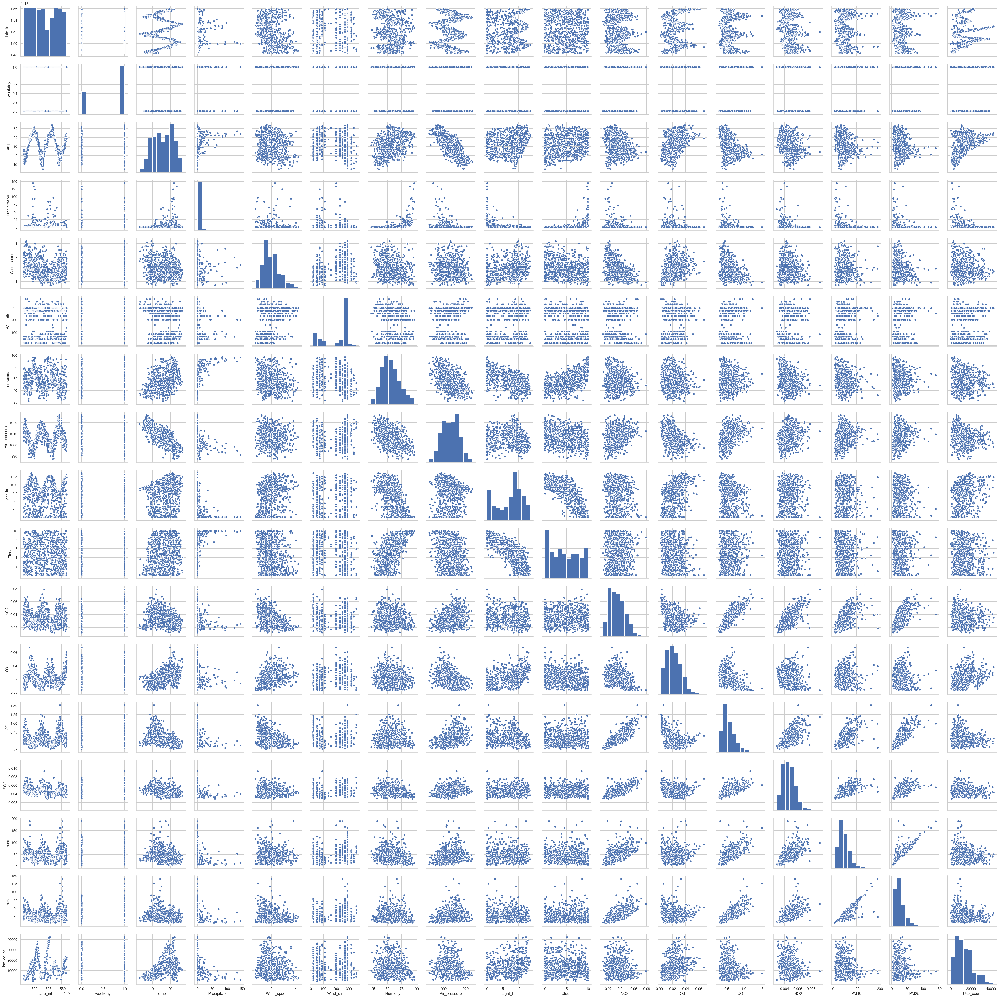

In [73]:
sns.pairplot(df)
plt.show()

## 2.1 대기오염도 정보들의 상관관계

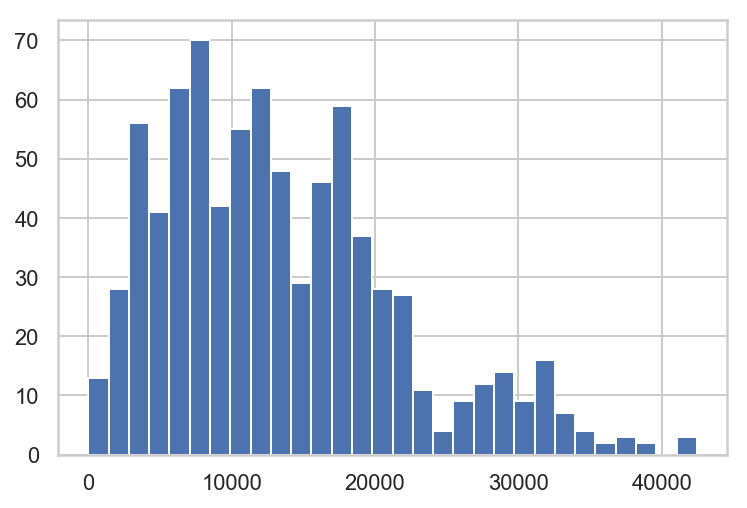

In [318]:
plt.hist(df["Use_count"], bins = 30)
plt.show()

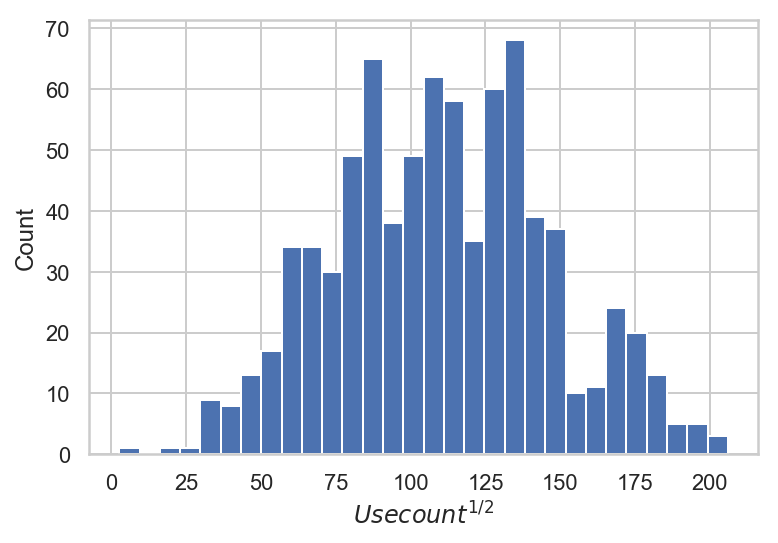

In [323]:
plt.hist(df["Use_count"].apply(lambda x : x **(1/2)), bins = 30)
plt.xlabel("$Usecount^{1/2}$")
plt.ylabel("Count")
plt.show()

In [74]:
df_pollution = df[["NO2", "O3", "CO", "SO2", "PM10", "PM25"]]

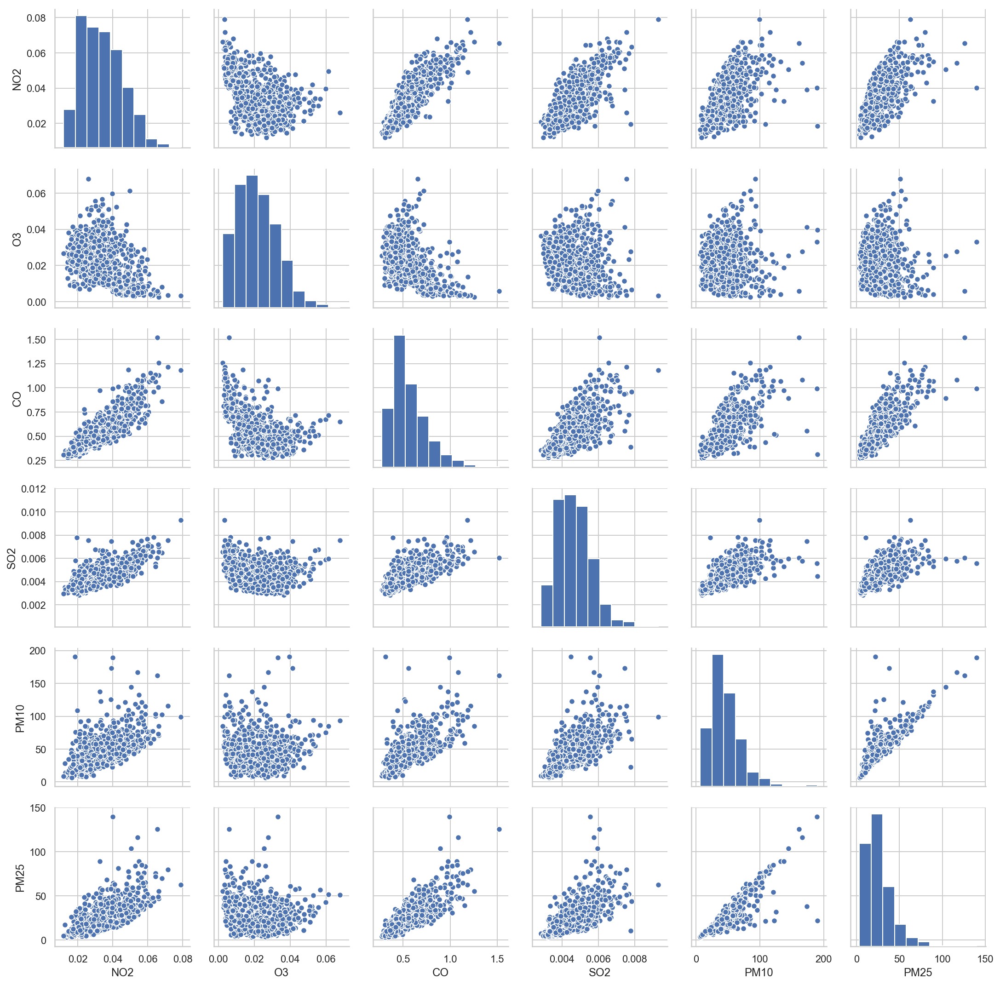

In [75]:
sns.pairplot(df_pollution)
plt.show()

In [76]:
df_pollution.corr()

,NO2,O3,CO,SO2,PM10,PM25
NO2,1.000000,-0.409768,0.859326,0.703484,0.601304,0.674041
O3,-0.409768,1.000000,-0.488100,-0.170864,0.004758,-0.065556
CO,0.859326,-0.488100,1.000000,0.669253,0.674014,0.777396
SO2,0.703484,-0.170864,0.669253,1.000000,0.652764,0.634651
PM10,0.601304,0.004758,0.674014,0.652764,1.000000,0.873589
PM25,0.674041,-0.065556,0.777396,0.634651,0.873589,1.000000


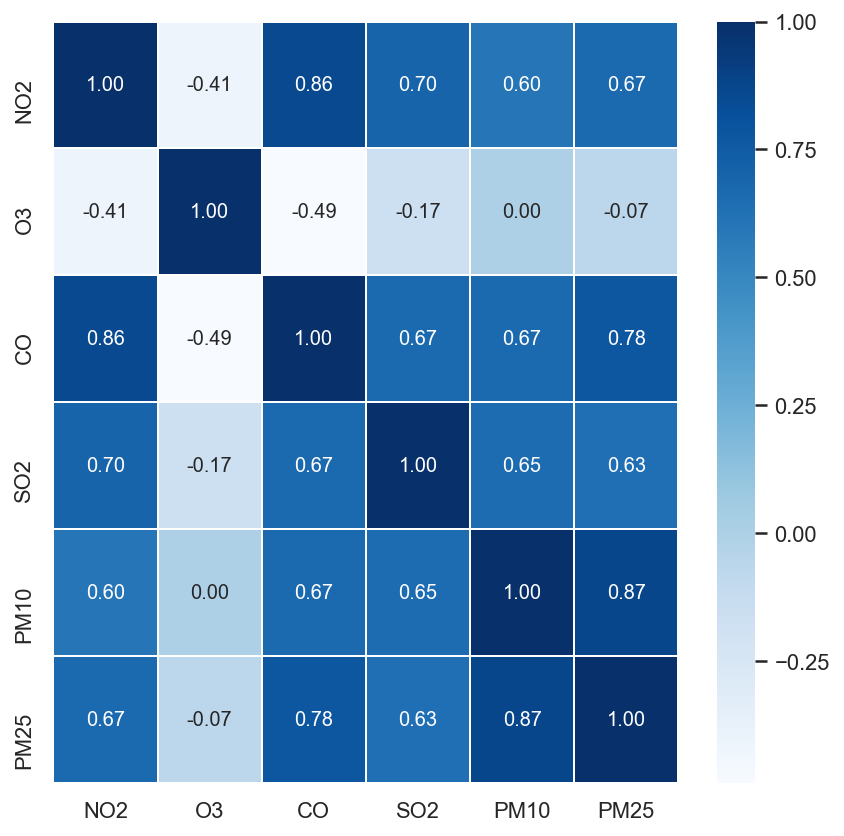

In [77]:
plt.figure(figsize=(7,7))
sns.heatmap(data = df_pollution.corr(), annot=True, fmt = '.2f', linewidths=.5, cmap='Blues')
plt.show()

- 오존을 제외한 다른 오염도끼리에 강한 상관관계가 나타남.
- 오염도는 바람의 영향을 많이 받으므로 강한 상관관계가 나타날 가능성이 높음.
- 다중공선성을 해결하기 위해 PM10과 오존 데이터만 사용하면 좋을 것으로 판단됨.

# 3. 독립변수와 종속변수 사이의 상관관계

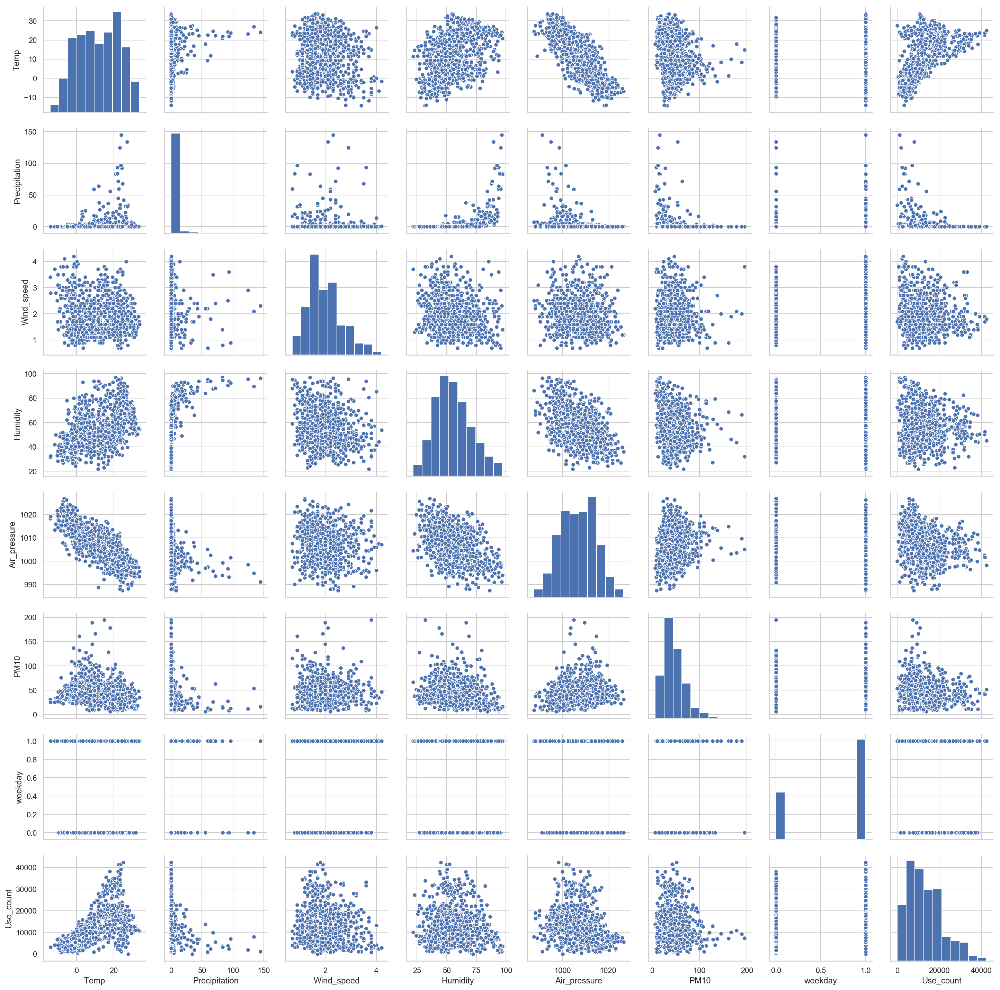

In [294]:
sns.pairplot(df[["Temp", "Precipitation", "Wind_speed", "Humidity", "Air_pressure", "PM10", "weekday", "Use_count"]])
plt.show()

## 3.1. Log: 강수량

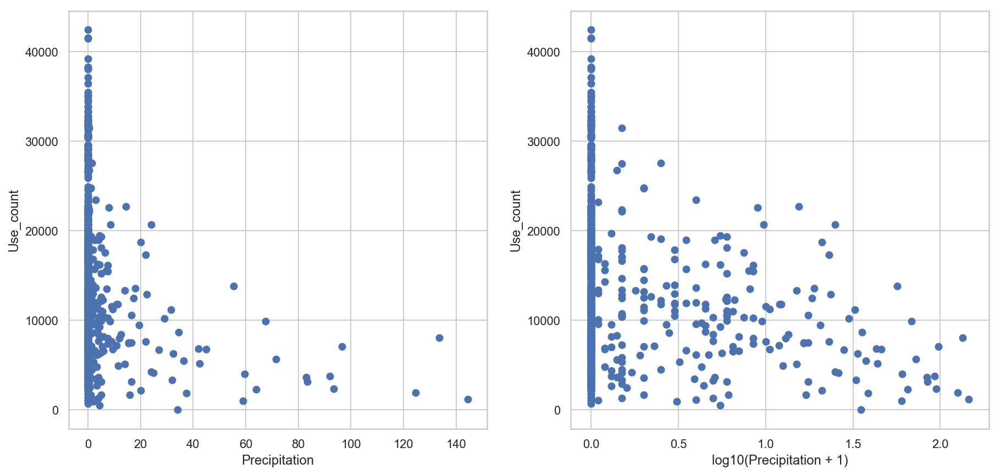

In [88]:
plt.figure(figsize = (15, 7))
plt.subplot(121)
plt.scatter(df["Precipitation"], df["Use_count"])
plt.xlabel("Precipitation")
plt.ylabel("Use_count")

plt.subplot(122)
plt.scatter(df["Precipitation"].apply(lambda x : np.log10(x+1)), df["Use_count"])
plt.xlabel("log10(Precipitation + 1)")
plt.ylabel("Use_count")
plt.show()

## 3.2. 기온

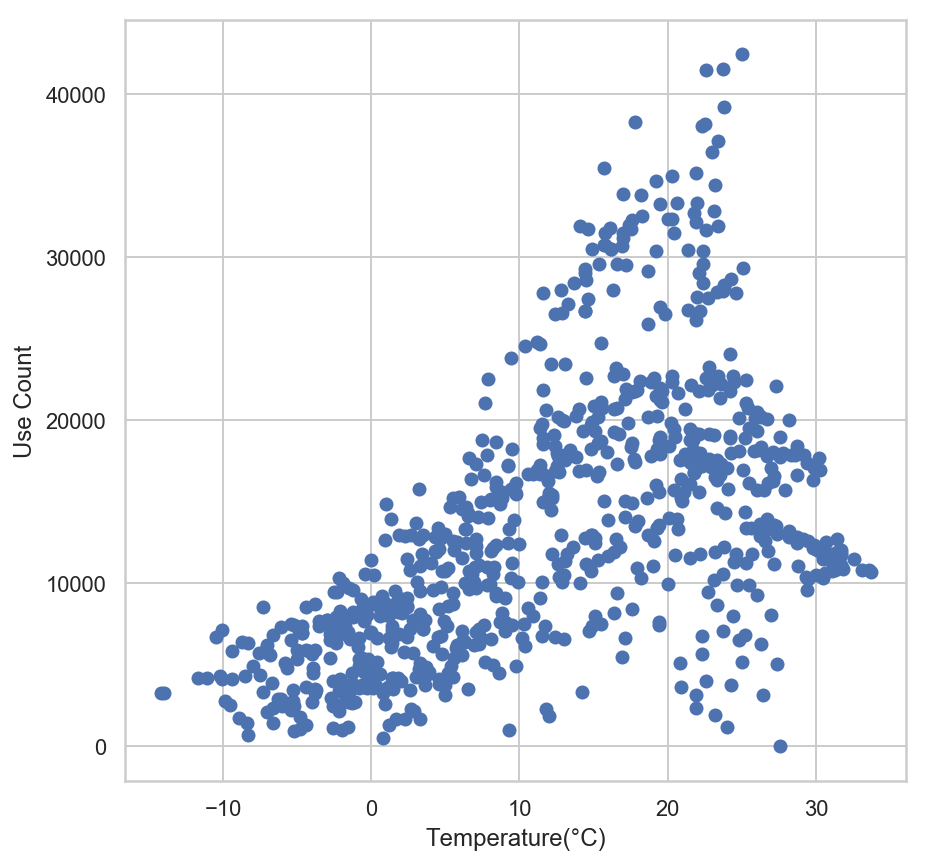

In [450]:
plt.figure(figsize=(7,7))
plt.scatter(df["Temp"], df["Use_count"])
plt.xlabel("Temperature(°C)")
plt.ylabel("Use Count")
plt.show()

# 4. Split train/test dataset

In [215]:
with open("data/daily/df_daily.pkl", "rb") as f:
    df = pickle.load(f)

In [216]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns = ["Use_count"]), df["Use_count"], test_size=0.3, random_state=1)
len(X_train), len(X_test), len(y_train), len(y_test)

(559, 240, 559, 240)

In [217]:
df_train = pd.concat([X_train, y_train], axis = 1)
df_test = pd.concat([X_test, y_test], axis = 1)

In [218]:
with open("data/daily/df_train.pkl", "wb") as f:
    pickle.dump(df_train, f)
with open("data/daily/df_test.pkl", "wb") as f:
    pickle.dump(df_test, f)

# 5. Design Linear Regression Model

### 교차 검증 Wrapper

In [3]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.base import BaseEstimator, RegressorMixin
import statsmodels.formula.api as smf
import statsmodels.api as sm

class StatsmodelsOLS(BaseEstimator, RegressorMixin):
    def __init__(self, formula):
        self.formula = formula
        self.model = None
        self.data = None
        self.result = None
        
    def fit(self, dfX, dfy):
        self.data = pd.concat([dfX, dfy], axis=1)
        self.model = smf.ols(self.formula, data=self.data)
        self.result = self.model.fit()
        
    def predict(self, new_data):
        return self.result.predict(new_data)

In [4]:
with open("data/daily/df_train.pkl", "rb") as f:
    df_train = pickle.load(f)
with open("data/daily/df_test.pkl", "rb") as f:
    df_test = pickle.load(f)

In [5]:
df_train = sm.add_constant(df_train)
df_test = sm.add_constant(df_test)

$ y $ ~ $scale(x) + 1$  or $ y $ ~ $C(x) + 1$

In [422]:
default_formula = list(map(lambda x : "scale({})".format(x), df_train.columns[2:-1]))
formula_dict = dict(zip(df_train.columns[2:-1], default_formula))
formula_dict["weekday"] = "C(weekday)"
formula_dict

{'date_int': 'scale(date_int)',
 'weekday': 'C(weekday)',
 'Temp': 'scale(Temp)',
 'Precipitation': 'scale(Precipitation)',
 'Wind_speed': 'scale(Wind_speed)',
 'Wind_dir': 'scale(Wind_dir)',
 'Humidity': 'scale(Humidity)',
 'Air_pressure': 'scale(Air_pressure)',
 'Light_hr': 'scale(Light_hr)',
 'Cloud': 'scale(Cloud)',
 'NO2': 'scale(NO2)',
 'O3': 'scale(O3)',
 'CO': 'scale(CO)',
 'SO2': 'scale(SO2)',
 'PM10': 'scale(PM10)',
 'PM25': 'scale(PM25)'}

In [427]:
cross_r2_ls = []
cross_r2_keys = []
for key, value in formula_dict.items():
    formula = "Use_count ~ {}".format(value)
    model = StatsmodelsOLS(formula)
    cv = KFold(5, shuffle=True, random_state=0)
    cross_val_r2 = cross_val_score(model, df_train.drop(columns=["Use_count"]), df_train["Use_count"], scoring="r2", cv=cv)
    cross_r2_keys.append(key)
    cross_r2_ls.append(round(np.mean(cross_val_r2), 4))

cross_df = pd.DataFrame(data = {"R2" : cross_r2_ls}, index = cross_r2_keys)

In [428]:
cross_df.T[["date_int", "weekday", "Temp", "Precipitation", "Wind_speed", "Wind_dir"]]

,date_int,weekday,Temp,Precipitation,Wind_speed,Wind_dir
R2,0.0106,-0.005,0.3072,0.0307,0.0001,-0.011


In [429]:
cross_df.T[["Humidity", "Air_pressure", "Light_hr", "Cloud", "O3", "PM10"]]

,Humidity,Air_pressure,Light_hr,Cloud,O3,PM10
R2,-0.0033,0.0905,0.098,-0.0001,0.1626,0.0181


평일 / 주말 더미변수와 다른 컬럼과의 interaction

In [363]:
cross_r2_ls = []
cross_r2_keys = []
for key, value in formula_dict.items():
    formula = "Use_count ~ C(weekday) + {}:C(weekday)".format(value)
    model = StatsmodelsOLS(formula)
    cv = KFold(5, shuffle=True, random_state=0)
    cross_val_r2 = cross_val_score(model, df_train.drop(columns=["Use_count"]), df_train["Use_count"], scoring="r2", cv=cv)
    cross_r2_keys.append(key)
    cross_r2_ls.append(round(np.mean(cross_val_r2), 4))

cross_df = pd.DataFrame(data = {"R2" : cross_r2_ls}, index = cross_r2_keys)
cross_df.T

,date_int,weekday,Temp,Precipitation,Wind_speed,Wind_dir,Humidity,Air_pressure,Light_hr,Cloud,NO2,O3,CO,SO2,PM10,PM25
R2,0.0074,-0.005,0.3077,0.0271,-0.0099,-0.017,-0.0029,0.0891,0.0899,-0.0111,0.0006,0.163,0.063,0.0761,0.0183,0.0204


In [304]:
def get_R2(var):
    formula = "Use_count ~ 1 + {}".format(formula_dict[var])[:-2]
    model = sm.OLS.from_formula(formula, data = df_train)
    result = model.fit()
    y_pred = result.predict(df_test)
    test_R2 = sk.metrics.r2_score(df_test["Use_count"], y_pred)
    return "{}에 대한 2차 모형 Rsquared = {}".format(var, round(test_R2, 3))

### 딕셔너리 수정

$y$ ~ $scale(Temp) + scale(Prec) + scale(pressure) + scale(Light\ hour) + scale(O_3) + scale(PM10) + scale(date)$

In [35]:
# 딕셔너리 초기화
default_formula = list(map(lambda x : "scale({}) +".format(x), df_train.columns[2:-1]))
formula_dict = dict(zip(df_train.columns[2:-1], default_formula))
formula_dict["weekday"] = "C(weekday) +"


# 사용하고 싶은 키 빼오기
formula_use_keys = ["Temp", "Precipitation", "Air_pressure", "Light_hr", "O3", "PM10", "date_int"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("Use_count ~ " + " ".join(formula_use_values))[:-2]
formula

'Use_count ~ scale(Temp) + scale(Precipitation) + scale(Air_pressure) + scale(Light_hr) + scale(O3) + scale(PM10) + scale(date_int)'

### K-Fold 교차 검증 (1차 선형 회귀)

In [36]:
model = StatsmodelsOLS(formula)
cv = KFold(5, shuffle=True, random_state=0)
cross_val_r2 = cross_val_score(model, df_train.drop(columns=["Use_count"]), df_train["Use_count"], scoring="r2", cv=cv)
print("K-Fold(5) 교차 검증 r2:{}".format(cross_val_r2))
print("교차 검증 r2 평균: {}".format(np.mean(cross_val_r2)))

K-Fold(5) 교차 검증 r2:[0.47483985 0.54822822 0.47878512 0.4100088  0.43561377]
교차 검증 r2 평균: 0.46949515166799405


$y$ ~ $scale(Temp) + scale(Temp^2) + scale(Temp^3) + scale(Temp^4)$

$\ \ \ + scale(log(Prec + 1)) + scale(pressure) + scale(pressure^2)$

$\ \ \ + scale(Lighthour) + scale(O_3) + scale(O_{3} ^2) + scale(PM10) + scale(date)$

In [433]:
# 딕셔너리 초기화
default_formula = list(map(lambda x : "scale({}) +".format(x), df_train.columns[2:-1]))
formula_dict = dict(zip(df_train.columns[2:-1], default_formula))
formula_dict["weekday"] = "C(weekday) +"

# 딕셔너리 수정
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**3) + scale(Temp**4) +"
formula_dict["Precipitation"] = "scale(np.log(I(Precipitation + 1))) +"
formula_dict["O3"] = "scale(O3) + scale(O3**2) +"
formula_dict["Air_pressure"] = "scale(Air_pressure) + scale(Air_pressure**2) +"


# formula_dict["weekday"] = "C(weekday) +"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["Temp", "Precipitation", "Air_pressure", "Light_hr", "O3", "PM10", "date_int"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("Use_count ~ " + " ".join(formula_use_values))[:-2]
formula

'Use_count ~ scale(Temp) + scale(Temp**2) + scale(Temp**3) + scale(Temp**4) + scale(np.log(I(Precipitation + 1))) + scale(Air_pressure) + scale(Air_pressure**2) + scale(Light_hr) + scale(O3) + scale(O3**2) + scale(PM10) + scale(date_int)'

### K-Fold 교차 검증

In [431]:
model = StatsmodelsOLS(formula)
cv = KFold(5, shuffle=True, random_state=0)
cross_val_r2 = cross_val_score(model, df_train.drop(columns=["Use_count"]), df_train["Use_count"], scoring="r2", cv=cv)
print("K-Fold(5) 교차 검증 r2:{}".format(cross_val_r2))
print("교차 검증 r2 평균: {}".format(np.mean(cross_val_r2)))

K-Fold(5) 교차 검증 r2:[0.66324121 0.69147767 0.67831566 0.60609726 0.6612467 ]
교차 검증 r2 평균: 0.6600756998560818


### 모델 Fit

In [432]:
model = sm.OLS.from_formula(formula, data = df_train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:              Use_count   R-squared:                       0.680
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     96.47
Date:                Wed, 19 Jun 2019   Prob (F-statistic):          2.39e-126
Time:                        14:24:33   Log-Likelihood:                -5529.8
No. Observations:                 559   AIC:                         1.109e+04
Df Residuals:                     546   BIC:                         1.114e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
In

### 필요없는 컬럼 제거

$ y $ ~ $scale(Temp) + scale(Temp^2) + scale(Temp^4) + scale(log(Prec + 1)) $
$\ \ \ + scale(pressure) + scale(pressure^2) + scale(PM10) + scale(date)$

In [6]:
# 딕셔너리 초기화
default_formula = list(map(lambda x : "scale({}) +".format(x), df_train.columns[2:-1]))
formula_dict = dict(zip(df_train.columns[2:-1], default_formula))

# 딕셔너리 수정
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4) +"
formula_dict["Precipitation"] = "scale(np.log(I(Precipitation + 1))) +"
formula_dict["Air_pressure"] = "scale(Air_pressure) + scale(Air_pressure**2) +"


# formula_dict["weekday"] = "C(weekday) +"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["Temp", "Precipitation", "Air_pressure", "PM10", "date_int"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("Use_count ~ " + " ".join(formula_use_values))[:-2]
formula

'Use_count ~ scale(Temp) + scale(Temp**2) + scale(Temp**4) + scale(np.log(I(Precipitation + 1))) + scale(Air_pressure) + scale(Air_pressure**2) + scale(PM10) + scale(date_int)'

### K-Fold 교차 검증

In [7]:
model = StatsmodelsOLS(formula)
cv = KFold(5, shuffle=True, random_state=0)
cross_val_r2 = cross_val_score(model, df_train.drop(columns=["Use_count"]), df_train["Use_count"], scoring="r2", cv=cv)
print("K-Fold(5) 교차 검증 r2:{}".format(cross_val_r2))
print("교차 검증 r2 평균: {}".format(np.mean(cross_val_r2)))

K-Fold(5) 교차 검증 r2:[0.66700372 0.68981998 0.69575044 0.60828565 0.65853216]
교차 검증 r2 평균: 0.6638783903695107


In [8]:
model = sm.OLS.from_formula(formula, data = df_train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:              Use_count   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.674
Method:                 Least Squares   F-statistic:                     145.0
Date:                Wed, 19 Jun 2019   Prob (F-statistic):          3.58e-130
Time:                        16:20:59   Log-Likelihood:                -5530.8
No. Observations:                 559   AIC:                         1.108e+04
Df Residuals:                     550   BIC:                         1.112e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
In

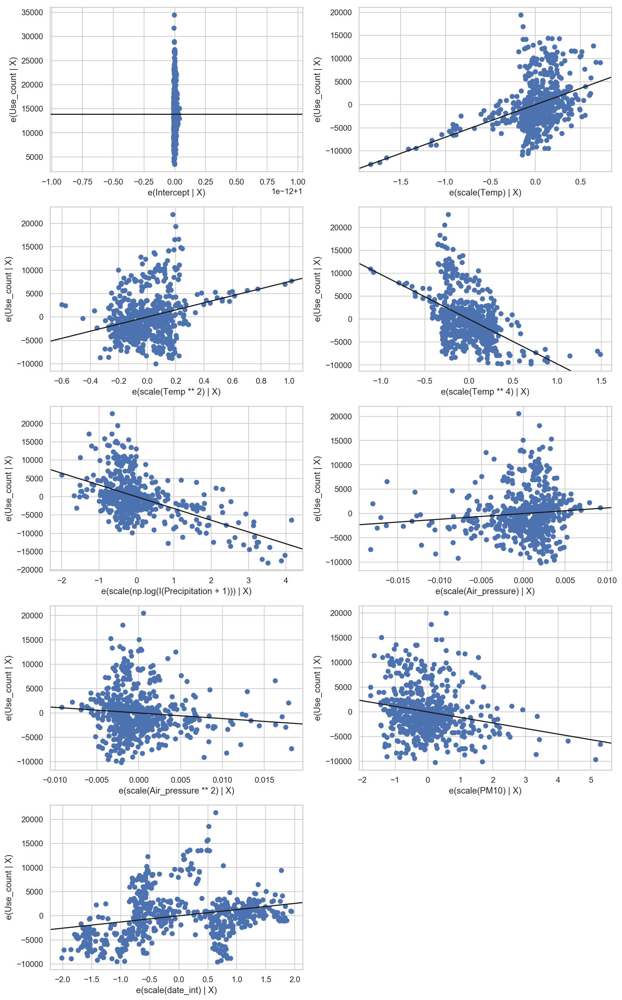

In [437]:
fig = plt.figure(figsize=(12, 20))
sm.graphics.plot_partregress_grid(result, fig=fig)
fig.suptitle("")
plt.show()

### Test set에 넣어 결과 확인

In [20]:
y_pred = result.predict(df_test)
test_R2 = sk.metrics.r2_score(df_test["Use_count"], y_pred)

#### 그래프 해석 
- 따릉이 Use Count가 낮을 때는 예측이 높게 되고, 높을 때는 예측이 낮게 되는 특성을 보인다.
- 예측률을 감소시키는 요인에 대해 생각해보자
    - 강수량이 일 합계이다 보니, 비가 매우 짧게 왔을 경우, 다른 시간에 똑같이 탄다면, 이 데이터를 커버하지 못함.
        - 시간 분석을 해야할 수도 있음
    - 데이터가 전반적으로 라인에 있지 않고, 산발적임
        - 시간에 따른 따릉이의 보급률을 고려하지 못함.

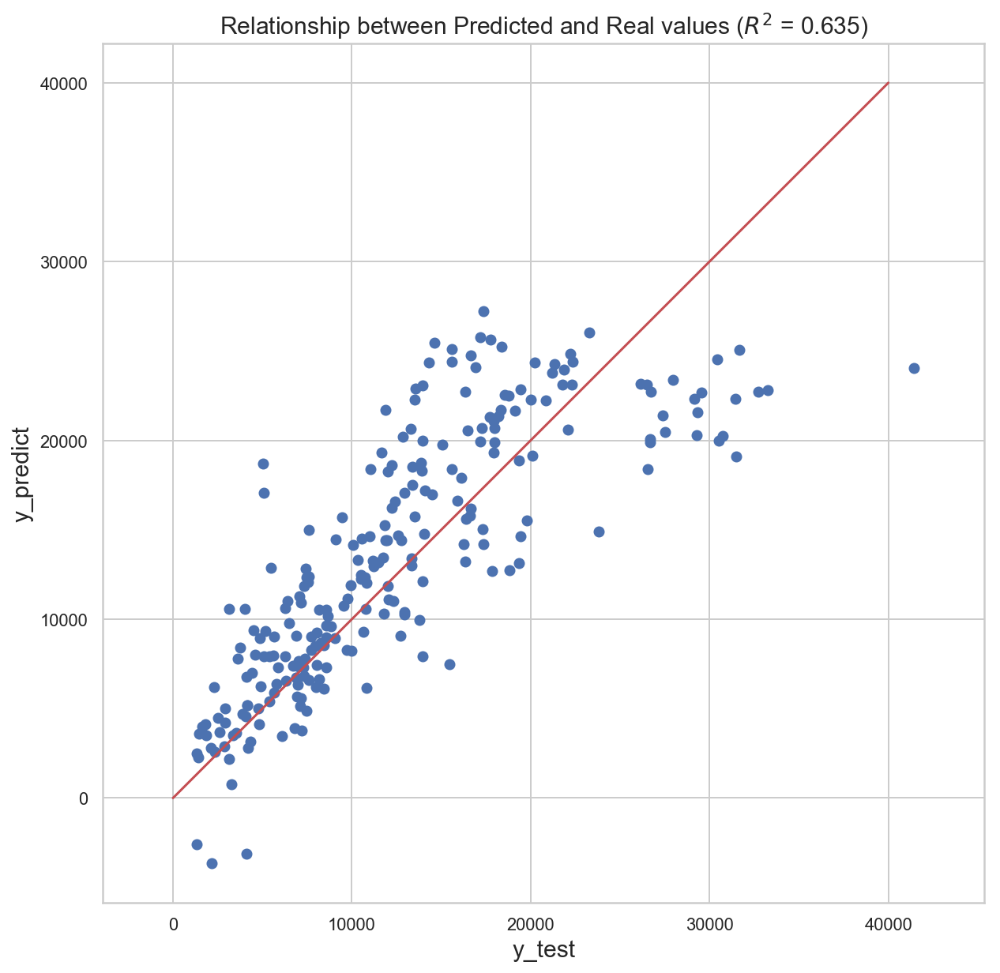

In [439]:
plt.figure(figsize = (10, 10))
plt.scatter(df_test["Use_count"], y_pred)
plt.plot([0, 40000], [0, 40000], "r")
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()

In [27]:
# 딕셔너리 초기화
default_formula = list(map(lambda x : "scale({}) +".format(x), df_train.columns[2:-1]))
formula_dict = dict(zip(df_train.columns[2:-1], default_formula))

# 딕셔너리 수정
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4) +"
formula_dict["Precipitation"] = "scale(np.log(I(Precipitation + 1))) +"
formula_dict["Air_pressure"] = "scale(Air_pressure) + scale(Air_pressure**2) +"


# formula_dict["weekday"] = "C(weekday) +"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["Temp", "Precipitation", "Air_pressure", "PM10", "date_int"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("Use_count ~ " + " ".join(formula_use_values))[:-2]
formula

'Use_count ~ scale(Temp) + scale(Temp**2) + scale(Temp**4) + scale(np.log(I(Precipitation + 1))) + scale(Air_pressure) + scale(Air_pressure**2) + scale(PM10) + scale(date_int)'

In [29]:
model = StatsmodelsOLS(formula)
cv = KFold(5, shuffle=True, random_state=0)
cross_val_r2 = cross_val_score(model, df_train.drop(columns=["Use_count"]), df_train["Use_count"].apply(lambda x : x**(1/2)), scoring="r2", cv=cv)
print("K-Fold(5) 교차 검증 r2:{}".format(cross_val_r2))
print("교차 검증 r2 평균: {}".format(np.mean(cross_val_r2)))

K-Fold(5) 교차 검증 r2:[0.72531187 0.74788721 0.75369126 0.69765177 0.71903584]
교차 검증 r2 평균: 0.7287155890661772


                               OLS Regression Results                              
Dep. Variable:     I(Use_count ** (1 / 2))   R-squared:                       0.735
Model:                                 OLS   Adj. R-squared:                  0.732
Method:                      Least Squares   F-statistic:                     255.1
Date:                     Wed, 19 Jun 2019   Prob (F-statistic):          1.46e-155
Time:                             17:04:06   Log-Likelihood:                -2434.8
No. Observations:                      559   AIC:                             4884.
Df Residuals:                          552   BIC:                             4914.
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

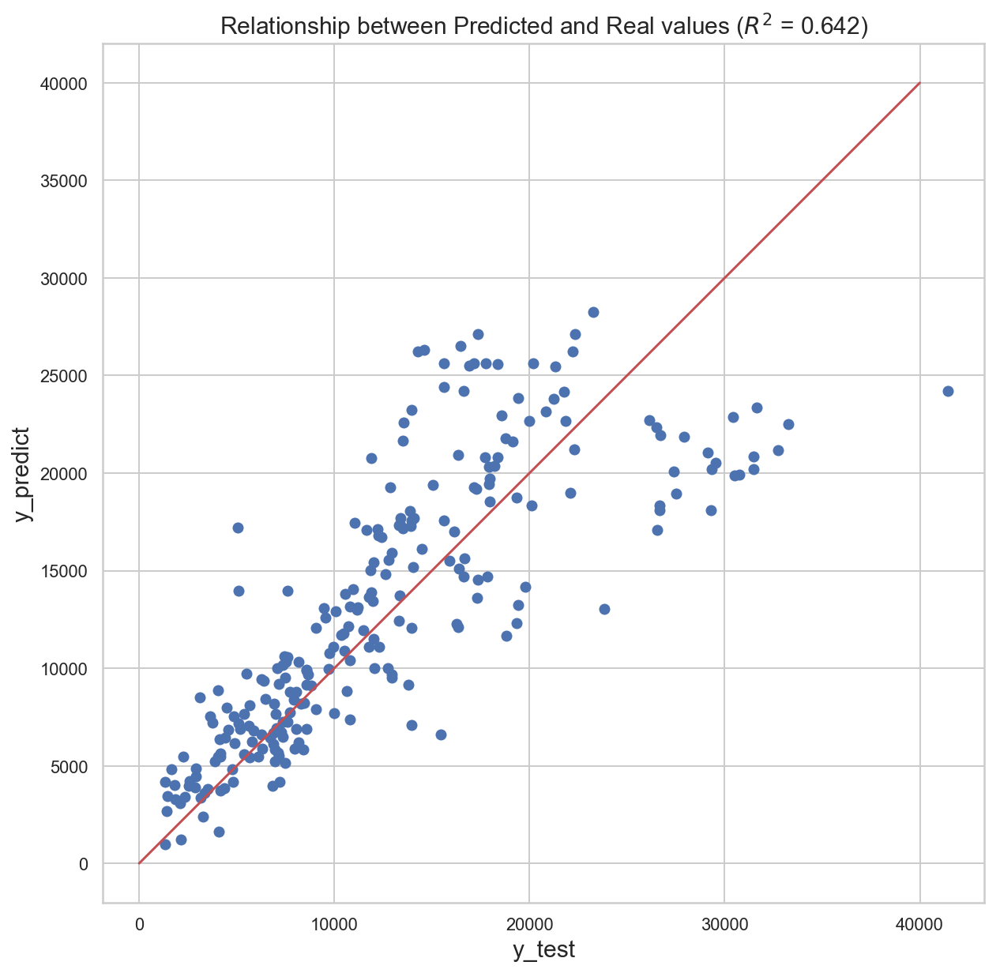

In [33]:
# 딕셔너리 초기화
default_formula = list(map(lambda x : "scale({}) +".format(x), df_train.columns[2:-1]))
formula_dict = dict(zip(df_train.columns[2:-1], default_formula))

# 딕셔너리 수정
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4) +"
formula_dict["Precipitation"] = "scale(np.log(I(Precipitation + 1))) +"
formula_dict["Air_pressure"] = "scale(Air_pressure) + scale(Air_pressure**2) +"


# formula_dict["weekday"] = "C(weekday) +"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["Temp", "Precipitation", "PM10", "date_int"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("I(Use_count ** (1/2)) ~ " + " ".join(formula_use_values))[:-2]

model = sm.OLS.from_formula(formula, data = df_train)
result = model.fit()
print(result.summary())

y_pred = result.predict(df_test)
test_R2 = sk.metrics.r2_score(df_test["Use_count"], y_pred ** 2)

plt.figure(figsize = (10, 10))
plt.scatter(df_test["Use_count"], y_pred ** 2)
plt.plot([0, 40000], [0, 40000], "r")
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()